In [10]:
import mikeio
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
import glob
from datetime import datetime, timedelta
from calendar import monthrange


for file in glob.glob(r"G:\MJI\BWDB_Tidal (104 nos.)\Output\Daily_Avg\*.xlsx"):
    
    # Splitting the folder path by seperator and creating a list
    path_list = file.split(os.sep)

    # Reading the daily average excel file
    df = pd.read_excel(file)

    # Defining a dictionary to store the year, month and montn's first date and last date
    start_end_time_dict = {}

    # Looping through all the year to whole timeseries montly start and end date dictionary
    for yr in df['Date'].dt.year.unique():

        # Defining a dictionary to store the yearly month start and end date dictionary
        year_dict = {}

        # Subsetting the yearly data from timeseries data
        yr_df = df[df['Date'].dt.strftime('%Y') == str(yr)]

        # Looping through each month of yearly subset data
        for month in yr_df['Date'].dt.month.unique():

            # Defining a list to store the first and last day of the month
            start_end_time_list = []

            # Subsetting the month data from the yearly data
            month_df = yr_df[yr_df['Date'].dt.month == month]

            # Finding the start date and end date of the month
            first_day = month_df['Date'].min()
            last_day = month_df['Date'].max()

            # Appending the first date and end date to the start_end_time list
            start_end_time_list.append(first_day)
            start_end_time_list.append(last_day)

            # Appending the monthly dictionary to the yearly dictionary
            year_dict[str(month)] = start_end_time_list

        # Appending the yearly dictionary to the total timeseries dictionary
        start_end_time_dict[str(yr)] = year_dict


    # Defining a dataframe to store the fortnightly middle value data
    fmd_mwl_df = pd.DataFrame()

    # Total number time segment in a month (example: fortnightly-2, weekly-4 etc.) [User Input]
    N = 2   ## Fortnightly

    # Looping through timeseries dictionary to get the start date and end date of a month
    for yr_key in start_end_time_dict:
        for month_key in start_end_time_dict[yr_key]:
            first_date = start_end_time_dict[yr_key][month_key][0]
            last_date = start_end_time_dict[yr_key][month_key][1]

            # Converting start date and end date of the month to datetime
            start_datetime = pd.to_datetime(first_date)
            end_datetime = pd.to_datetime(last_date)


            # Defining a dataframe to store the fortnightly date of the month
            dtm_list = []

            # Finding the difference between start date and end date of the month
            diff = end_datetime - start_datetime + timedelta(days=1)

            # Finding segment dates
            increment = (diff.round('D') - timedelta(days = diff.round('D').days % N))/ N

            for idx in range(0, N+1, 1):

                if idx == 0:
                    dtm_list.append((start_datetime + idx * increment).strftime("%Y/%m/%d"))

                elif 0 < idx < N:
                    dtm_list.append((start_datetime + idx * increment - timedelta(days=1)).strftime("%Y/%m/%d"))

                else:
                    dtm_list.append((end_datetime).strftime("%Y/%m/%d"))


            # Defining a list to store the middle date of each fortnight
            fortnightly_middle = []

            # Finding the difference between first date and first fortnight last date, finding the middle date difference and
            # Appending the middle date in the fortnightly middle date list
            diff_f1 = (pd.to_datetime(dtm_list[1]) - pd.to_datetime(dtm_list[0]))/2
            fortnightly_middle.append((pd.to_datetime(dtm_list[0]) + diff_f1.round('D')).strftime("%Y/%m/%d"))

            # Finding the difference between second fortnight firsr date and late date and finding the middle date difference and
            # Appending the middle date in the fortnightly middle date list
            diff_f2 = (pd.to_datetime(dtm_list[2]) - pd.to_datetime(dtm_list[1]))/2
            fortnightly_middle.append((pd.to_datetime(dtm_list[1]) + diff_f2.round('D')).strftime("%Y/%m/%d"))

            # Filtering out the middle date data from the timeseries dataframe
            mask = (df['Date'] == fortnightly_middle[0]) | (df['Date'] == fortnightly_middle[1])
            r_df = df.loc[mask]

            # Appending the filtered date dataframe to the fortnightly middle dataframe
            fmd_mwl_df = pd.concat([fmd_mwl_df, r_df])
            fmd_mwl_df['Date'] = pd.to_datetime(fmd_mwl_df['Date'])
            fmd_mwl_df['Date'] = fmd_mwl_df['Date'].dt.strftime("%Y/%m/%d")
            
    # Saving the fortnigtly middle day daily mean value dataframe
    fmd_mwl_df.to_excel(r'G:\MJI\BWDB_Tidal (104 nos.)\Output\Fortnightly_Median_Day_Avg\{}_Fortnightly_Median_Day_Avg.xlsx'.format(path_list[-1][:-15]),
                           float_format="%.4f", index= False)
    
    print(path_list[-1][:-15])

SW1 (Bagerhat)
SW102 (Bhatiapara)
SW105 (Off Take at Atharobanka)
SW107 (Pirojpur)
SW107A (Nazirpur)
SW121 (Enayethat)
SW128 (Shakra)
SW129 (Basantapur)
SW130 (Kaikhali)
SW136.1 (Umedpur)
SW14.5 (Nawarhat)
SW152.2 (Kalurghat)
SW162 (Jhikargacha)
SW165 (Kobadak Forest Office)
SW168 (Faridpur)
SW170 (Bhanga)
SW177 (Lakhpur)
SW179 (Demra)
SW18 (Barisal)
SW18.1 (Bakerganj)
SW180 (Narayanganj)
SW183 (Kaitpara)
SW19 (Mirzaganj)
SW190 (Mostafapur)
SW193 (Kabirajpur)
SW198 (Haridaspur)
SW20 (Amtali)
SW204 (Chiringa)
SW21 (Arpara)
SW217 (Kala Chandpur)
SW219 (Gazirhat)
SW221.5 (Begumganj)
SW229 (Toke)
SW23 (Kalaroa)
SW230.1 (Bhairab Bazar Rly.)
SW241 (Khulna)
SW243 (Chalna)
SW244 (Mongla)
SW248 (Dohazari)
SW25 (Chapra)
SW253 (Swarupkati)
SW253A (Uzirpur)
SW258 (Paikgacha)
SW259 (Nalianala_ H
SW26 (Protapnagar)
SW270 (Markuli)
SW271 (Azmiriganj)
SW272 (Madna)
SW272.1 (Autogram)
SW273 (Bhairab Bazar)
SW274 (Narsingdi)
SW275 (Badyar Bazar
SW275.5 (Meghna Ferry Ghat)
SW276 (Satnal)
SW277 (Chandpur)

SW1 (Bagerhat)_Fortnightly_Median_Day_Avg
SW102 (Bhatiapara)_Fortnightly_Median_Day_Avg
SW105 (Off Take at Atharobanka)_Fortnightly_Median_Day_Avg
SW107 (Pirojpur)_Fortnightly_Median_Day_Avg
SW107A (Nazirpur)_Fortnightly_Median_Day_Avg
SW121 (Enayethat)_Fortnightly_Median_Day_Avg
SW128 (Shakra)_Fortnightly_Median_Day_Avg
SW129 (Basantapur)_Fortnightly_Median_Day_Avg
SW130 (Kaikhali)_Fortnightly_Median_Day_Avg
SW136.1 (Umedpur)_Fortnightly_Median_Day_Avg
SW14.5 (Nawarhat)_Fortnightly_Median_Day_Avg
SW152.2 (Kalurghat)_Fortnightly_Median_Day_Avg
SW162 (Jhikargacha)_Fortnightly_Median_Day_Avg
SW165 (Kobadak Forest Office)_Fortnightly_Median_Day_Avg
SW168 (Faridpur)_Fortnightly_Median_Day_Avg
SW170 (Bhanga)_Fortnightly_Median_Day_Avg
SW177 (Lakhpur)_Fortnightly_Median_Day_Avg
SW179 (Demra)_Fortnightly_Median_Day_Avg
SW18 (Barisal)_Fortnightly_Median_Day_Avg
SW18.1 (Bakerganj)_Fortnightly_Median_Day_Avg


C:\Users\MDS\anaconda3\envs\py377\lib\site-packages\ipykernel_launcher.py:222: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


SW180 (Narayanganj)_Fortnightly_Median_Day_Avg
SW183 (Kaitpara)_Fortnightly_Median_Day_Avg
SW19 (Mirzaganj)_Fortnightly_Median_Day_Avg
SW190 (Mostafapur)_Fortnightly_Median_Day_Avg
SW193 (Kabirajpur)_Fortnightly_Median_Day_Avg
SW198 (Haridaspur)_Fortnightly_Median_Day_Avg
SW20 (Amtali)_Fortnightly_Median_Day_Avg
SW204 (Chiringa)_Fortnightly_Median_Day_Avg
SW21 (Arpara)_Fortnightly_Median_Day_Avg
SW217 (Kala Chandpur)_Fortnightly_Median_Day_Avg
SW219 (Gazirhat)_Fortnightly_Median_Day_Avg
SW221.5 (Begumganj)_Fortnightly_Median_Day_Avg
SW229 (Toke)_Fortnightly_Median_Day_Avg
SW23 (Kalaroa)_Fortnightly_Median_Day_Avg
SW230.1 (Bhairab Bazar Rly.)_Fortnightly_Median_Day_Avg
SW241 (Khulna)_Fortnightly_Median_Day_Avg
SW243 (Chalna)_Fortnightly_Median_Day_Avg
SW244 (Mongla)_Fortnightly_Median_Day_Avg
SW248 (Dohazari)_Fortnightly_Median_Day_Avg
SW25 (Chapra)_Fortnightly_Median_Day_Avg
SW253 (Swarupkati)_Fortnightly_Median_Day_Avg
SW253A (Uzirpur)_Fortnightly_Median_Day_Avg
SW258 (Paikgacha)_Fort

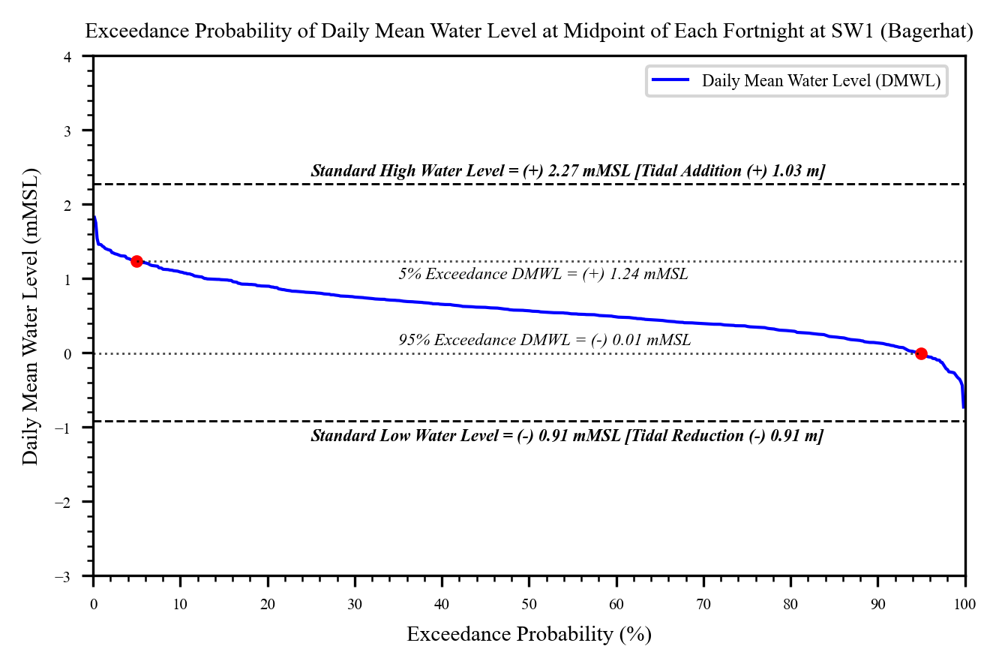

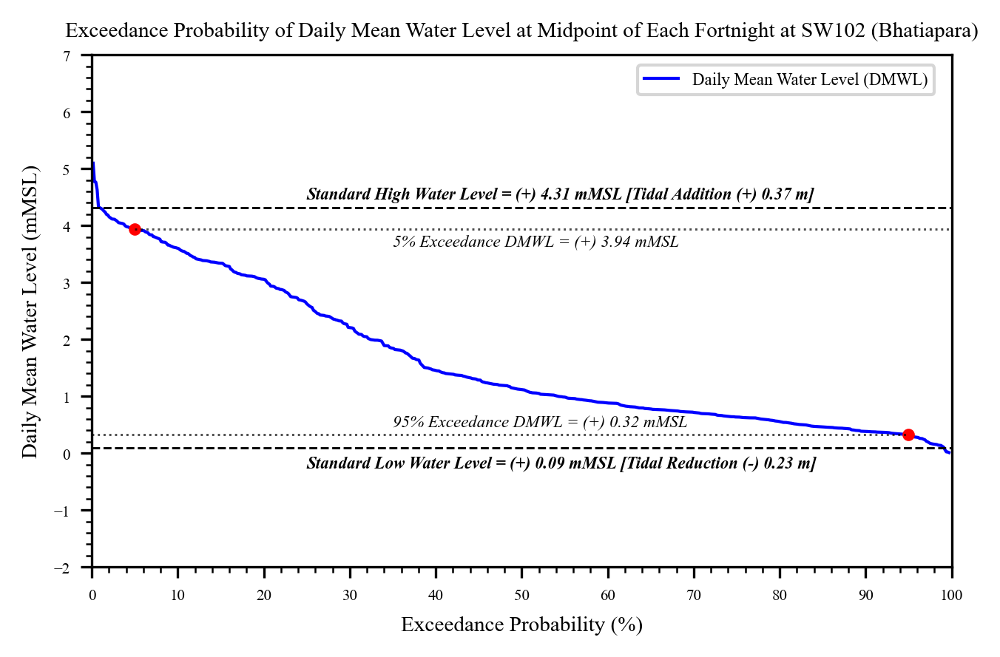

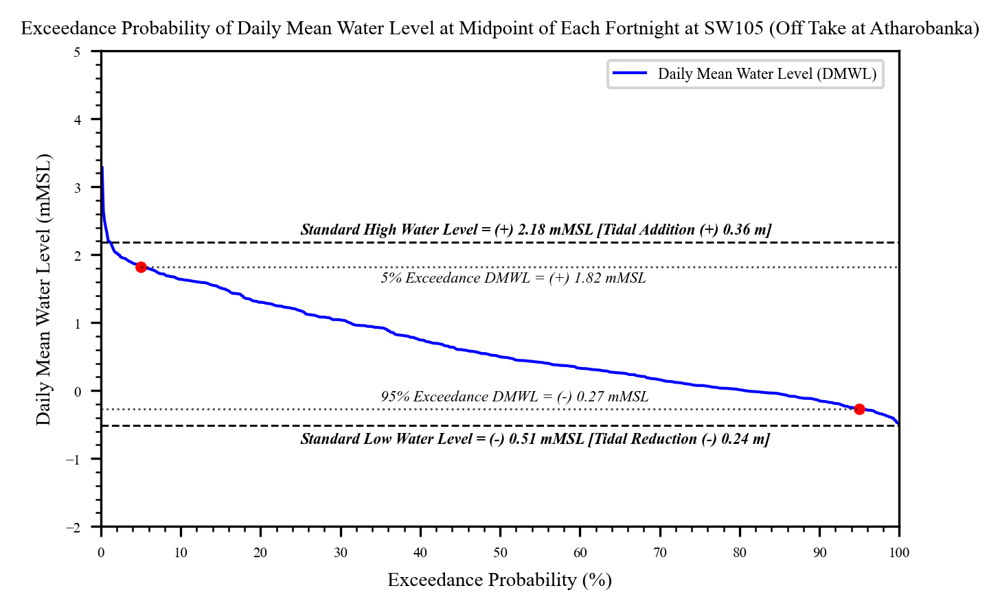

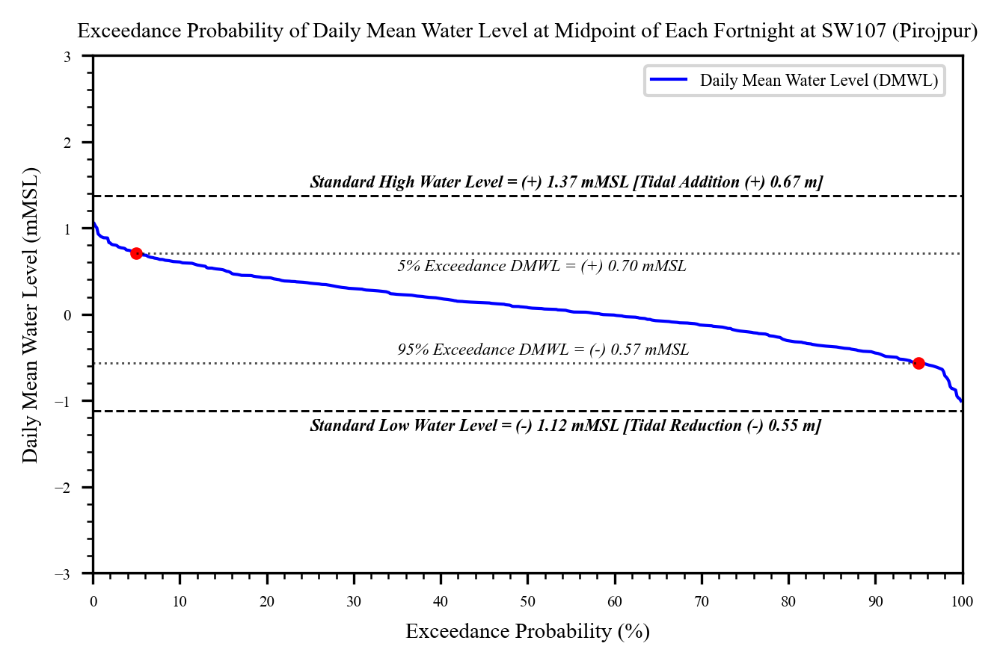

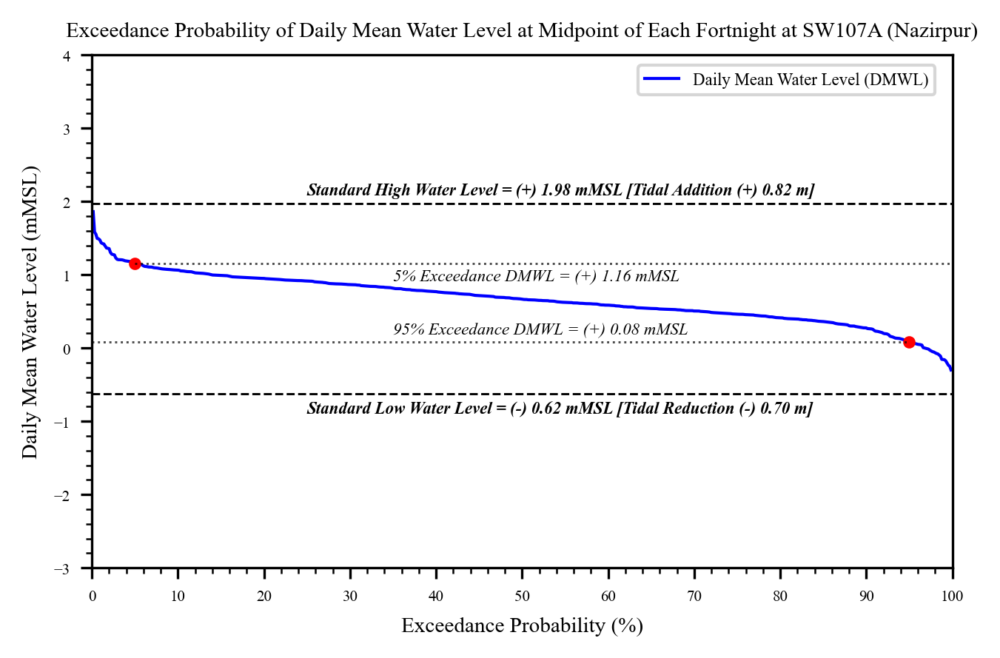

...

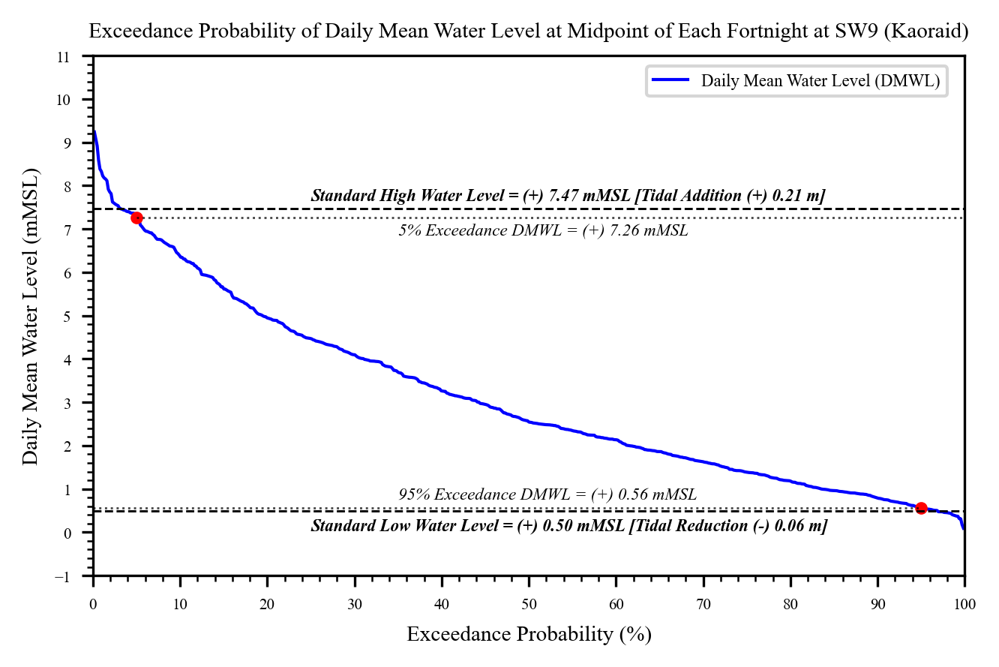

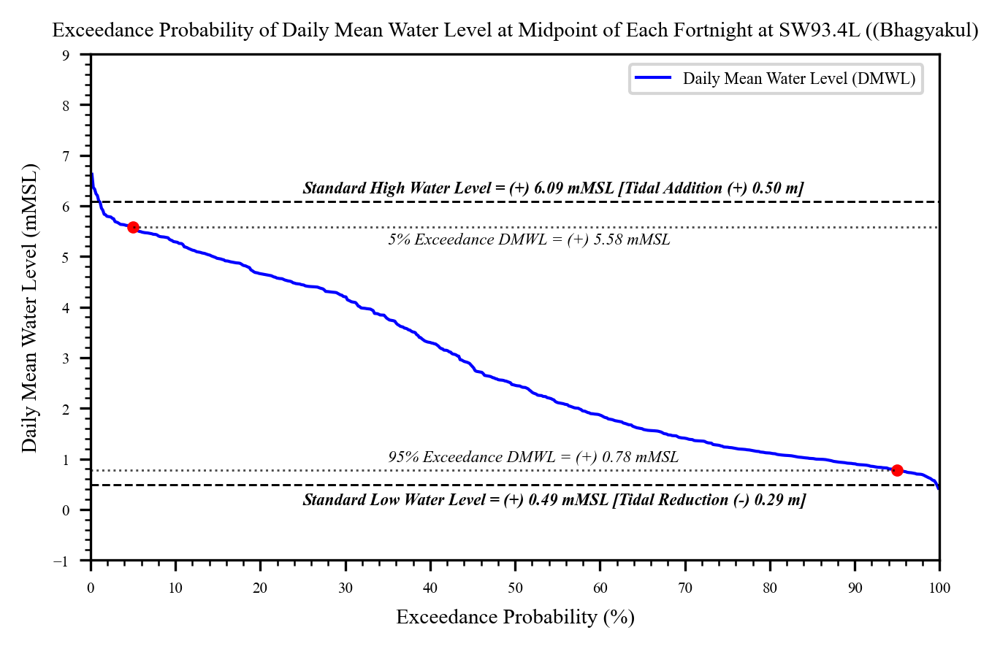

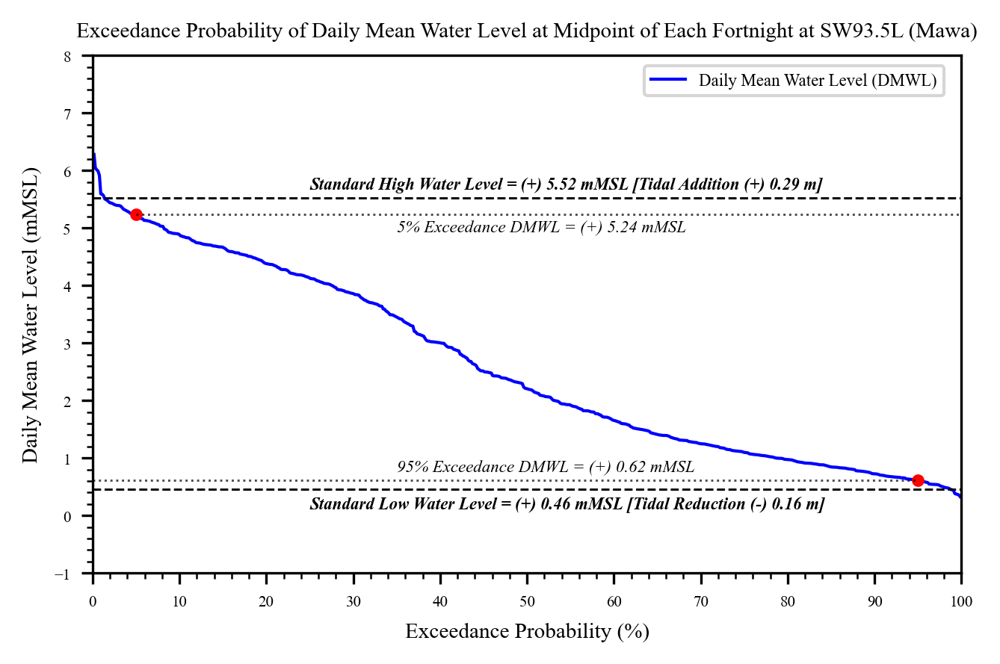

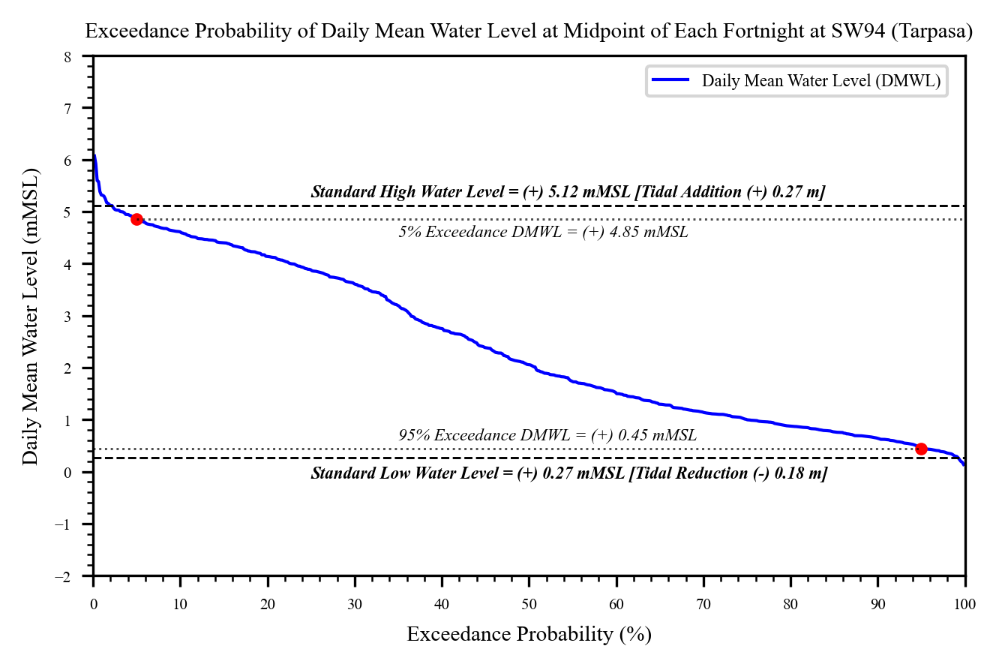

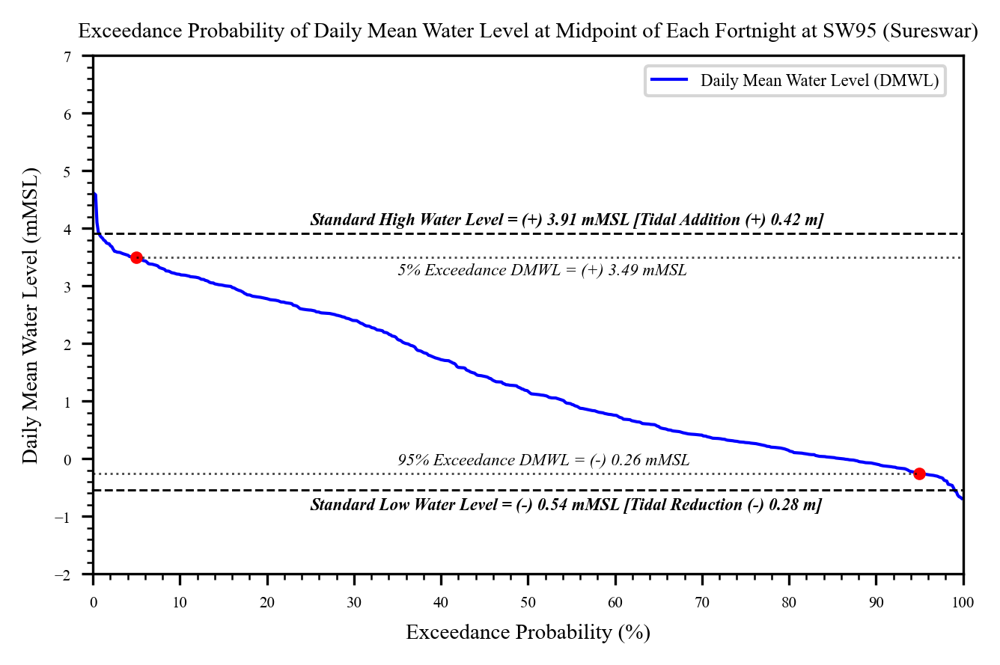

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import math
import os
import glob
import openpyxl


# Creating a function to remove the spaces from each item of a string list and returning as a space free item list
def string_space_removal(cons_list):
    cons_name_list = []

    for i in range(0, len(cons_list), 1):
        #         cons_name = cons_list[i].strip() #[Remove space at the beginning and at the end of the string]
        cons_name = cons_list[i].replace(" ", "")

        cons_name_list.append(cons_name)

    return cons_name_list


# Defining a function to calculate the tidal addition for SHWL
def TA_TR_calculation(con_file_path):
    cons_file = con_file_path

    # Reading the constituent file as a table using pandas and creating a dataframe
    txt_df = pd.read_table(cons_file)

    # Creating a new dataframe by taking all rows except the first row using index
    r_txt_df = txt_df[1:]

    # Extracting only first four items using index no. from each row, removing all spaces and casting it as integer
    # to get the "serial no." list of consisting each constituent
    serial_no = r_txt_df[' Constituents from analysis:'].str[:5].replace(" ", "").astype(int)

    # Extracting item 6 to 9 from first(four item) using index no. from each row,
    # removing all spaces using the created function and casting it as float
    # to get the "Constituent Name" list of consisting each constituent
    cons_list = list(r_txt_df[' Constituents from analysis:'].str[6:10])
    constituent_name = string_space_removal(cons_list)

    # Extracting item 14 to 7 from last(six item) using index no. from each row, removing all spaces and casting it as float
    # to get the "Amplitude" list of consisting each constituent
    amplitude = r_txt_df[' Constituents from analysis:'].str[-14:-8].replace(" ", "").astype(float)

    # Extracting last six items using index no. from each row, removing all spaces and casting it as float
    # to get the "Phase" list of consisting each constituent
    phase = r_txt_df[' Constituents from analysis:'].str[-6:].replace(" ", "").astype(float)

    # Creating a dataframe using "Serial no","Constituent Name","Amplitude" & "Phase" list and resetting the name
    cons_df = pd.DataFrame({'serial_no': serial_no, 'constituent_name': constituent_name,
                            'amplitude': amplitude, 'phase': phase})
    cons_df.reset_index(drop=True, inplace=True)

    # Extracting required constituent values(Amplitude of Constituent M2, S2 and MSF) to determine Tidal Addition(TA) for SHWL
    Amp_M2 = cons_df[cons_df['constituent_name'] == 'M2']['amplitude'].values[0]
    Amp_S2 = cons_df[cons_df['constituent_name'] == 'S2']['amplitude'].values[0]
    Amp_MSF = cons_df[cons_df['constituent_name'] == 'MSF']['amplitude'].values[0]

    # Tidal Addition(TA) for SHWL from Tidal Constituents [Using Equation, SHWL = 1.1*(M2 + S2) + MSF]
    tidal_addition = (1.1 * (Amp_M2 + Amp_S2)) + Amp_MSF

    # Spring Tidal Reduction(STR) for SLWL from Tidal Constituents [Using Equation, SHWL = -(1.1*(M2 + S2) + MSF)]
    spring_tidal_reduction = - ((1.1 * (Amp_M2 + Amp_S2)) - Amp_MSF)

    # Neap Tidal Reduction(NTR) for SLWL from Tidal Constituents [Using Equation, SHWL = -(1.1*(M2 + S2) + MSF)]
    neap_tidal_reduction = - ((1.1 * (Amp_M2 - Amp_S2)) + Amp_MSF)

    return Amp_M2, Amp_S2, Amp_MSF, tidal_addition, spring_tidal_reduction, neap_tidal_reduction


# Defining a function to make an annotation text combining SHWL & Tidal Addition or SLWL and Tidal Reduction for the plot
def lwl_annotation(SLWL, tidal_reduction):
    # SLWL (-) negative and tidal reduction (-) negative
    if SLWL < 0 and tidal_reduction < 0:
        anot_label_4 = 'Standard Low Water Level = (-) {b} mMSL [Tidal Reduction (-) {c} m]'.format(
            b="%.2f" % abs(SLWL),
            c="%.2f" % abs(tidal_reduction))
        return anot_label_4

    # SLWL (-) negative and tidal reduction (-) zero
    elif SLWL < 0 and tidal_reduction == 0:
        anot_label_4 = 'Standard Low Water Level = (-) {b} mMSL [Tidal Reduction {c} m]'.format(b="%.2f" % abs(SLWL),
                                                                                                c="%.2f" % abs(
                                                                                                    tidal_reduction))
        return anot_label_4

    # SLWL (0) zero and tidal reduction (-) negative
    elif SLWL == 0 and tidal_reduction < 0:
        anot_label_4 = 'Standard Low Water Level = {b} mMSL [Tidal Reduction (-) {c} m]'.format(b="%.2f" % SLWL,
                                                                                                c="%.2f" % abs(
                                                                                                    tidal_reduction))
        return anot_label_4

    # SLWL (+) positive and tidal reduction (-) negative
    elif SLWL > 0 and tidal_reduction < 0:
        anot_label_4 = 'Standard Low Water Level = (+) {b} mMSL [Tidal Reduction (-) {c} m]'.format(b="%.2f" % SLWL,
                                                                                                    c="%.2f" % abs(
                                                                                                        tidal_reduction))
        return anot_label_4

    # SLWL (+) positive and tidal reduction (0) zero
    elif SLWL > 0 and tidal_reduction == 0:
        anot_label_4 = 'Standard Low Water Level = (+) {b} mMSL [Tidal Reduction {c} m]'.format(b="%.2f" % SLWL,
                                                                                                c="%.2f" % abs(
                                                                                                    tidal_reduction))
        return anot_label_4

    # SLWL (+) positive and tidal reduction (+) positive
    else:
        anot_label_4 = 'Standard Low Water Level = (+) {b} mMSL [Tidal Reduction (+) {c} m]'.format(b="%.2f" % SLWL,
                                                                                                    c="%.2f" % abs(
                                                                                                        tidal_reduction))
        return anot_label_4


# Defining exceedance probability corresponding water level annotation for the plot
def exceedance_probability_annotation(exceedance_proba, exceedance_wl):
    # For (-) negative water level
    if exceedance_wl < 0:
        anot_label = '{a}% Exceedance DMWL = (-) {b} mMSL'.format(a=exceedance_proba, b="%.2f" % abs(exceedance_wl))

    # For water level equal to zero (0)
    elif exceedance_wl == 0:
        anot_label = '{a}% Exceedance DMWL = {b} mMSL'.format(a=exceedance_proba, b="%.2f" % exceedance_wl)

    # For (+) positive water level
    else:
        anot_label = '{a}% Exceedance DMWL = (+) {b} mMSL'.format(a=exceedance_proba, b="%.2f" % exceedance_wl)

    return anot_label


# Setting the column name against which column the exceedance probability will be calculated (Requires User Input)
exceedance_prob_col_name = 'Modified_Cyclone'


# Defining a dataframe to store the SHWL and SLWL of each station (1.SWL = SHWL & SLWL, 2.SHWL, 3.SLWL )
station_swl_df = pd.DataFrame()
station_shwl_df = pd.DataFrame()
station_slwl_df = pd.DataFrame()

# Constituents file folder path
cons_folder_path = r'G:\MJI\BWDB_Tidal (104 nos.)\Output\Tidal_Constituents'

for file in glob.glob(r"G:\MJI\BWDB_Tidal (104 nos.)\Output\Fortnightly_Median_Day_Avg\*.xlsx"):

    # Splitting the file path with seperator to create path list
    path_list = file.split(os.sep)
    station_id = path_list[-1][:-32]

    # Reading Fortnightly Average Wl file
    df = pd.read_excel(file)

    # Calculating Exceedance Probability of each WL (by removing the blank rows, ranking the water level
    df.dropna(subset=[exceedance_prob_col_name], inplace=True)
    df.sort_values(by= exceedance_prob_col_name, ascending=False, inplace=True)

    # Calculating probability using p = r * 100 / (n + 1)
    df['Ranking'] = df[exceedance_prob_col_name].rank(method='min', ascending=False)
    df['Exceedence Probability (%)'] = (df.loc[:, 'Ranking'] * 100) / (len(df[exceedance_prob_col_name]) + 1)

    # Determining 5% Exceedance Probability by interpolating
    probability_axis = df['Exceedence Probability (%)']  # input
    fortnightly_wl_axis = df[exceedance_prob_col_name]  # input

    # 5% and 95% Exceedance Probability
    probability_vals = [5, 95]

    # 5% and 95% Exceedance Probability Fortnightly Mean Water Level
    high_low_fwl = np.interp(probability_vals, probability_axis, fortnightly_wl_axis)

    # File path of tidal constituent file
    con_file_path = os.path.join(cons_folder_path, '{}.con'.format(station_id))

    # Calculating tidal addition and reduction using TA_TR_calculation function
    Amp_M2, Amp_S2, Amp_MSF, tidal_addition, spring_tidal_reduction, neap_tidal_reduction = TA_TR_calculation(con_file_path)

    tidal_reduction = min(spring_tidal_reduction, neap_tidal_reduction)

    # Calculating Standard High Water Level [SWHL] (SHWL = 5% Fortnightly Mean WL + Tidal Addition)
    SHWL = high_low_fwl[0] + tidal_addition

    # Calculating Standard High Water Level [SWHL] (SHWL = 95% Fortnightly Mean WL + Tidal Reduction)
    SLWL = high_low_fwl[1] + tidal_reduction

    # Creating a dataframe to store SHWL and SLWL of the station (1.SWL = SHWL & SLWL, 2.SHWL, 3.SLWL )
    SHWL_SLWL_df = pd.DataFrame({'Station ID':station_id, 'Exceedance Probability(%)':probability_vals,
                                 'Exceedance FMWL (mMSL)': high_low_fwl, 'M2 (m)': Amp_M2, 'S2 (m)': Amp_S2,
                                 'MSF (m)': Amp_MSF, 'Tidal Addition (m)': [tidal_addition, np.nan],
                                 'Spring Tidal Reduction (m)':[np.nan,spring_tidal_reduction],
                                 'Neap Tidal Reduction (m)':[np.nan,neap_tidal_reduction], 
                                 'Tidal Reduction (m)':[np.nan, tidal_reduction], 
                                 'SHWL (mMSL)':[SHWL,np.nan], 'SLWL (mMSL)':[np.nan, SLWL]})

    SHWL_df = pd.DataFrame({'Station ID':station_id, 'Exceedance Probability(%)':[probability_vals[0]],
                             'Exceedance FMWL (mMSL)': [high_low_fwl[0]], 'M2 (m)': Amp_M2, 'S2 (m)': Amp_S2,
                             'MSF (m)': Amp_MSF, 'Tidal Addition (m)': [tidal_addition],'SHWL (mMSL)':SHWL})

    SLWL_df = pd.DataFrame({'Station ID':station_id, 'Exceedance Probability(%)':[probability_vals[1]],
                             'Exceedance FMWL (mMSL)': [high_low_fwl[1]], 'M2 (m)': Amp_M2, 'S2 (m)': Amp_S2,
                             'MSF (m)': Amp_MSF, 'Spring Tidal Reduction (m)': spring_tidal_reduction,
                             'Neap Tidal Reduction (m)': neap_tidal_reduction, 
                             'Tidal Reduction (m)':tidal_reduction, 'SLWL (mMSL)': SLWL})

    # Updating the SHWL and SLWL datafrmae of each station to the station dataframe
    station_swl_df = pd.concat([station_swl_df, SHWL_SLWL_df])
    station_shwl_df = pd.concat([station_shwl_df, SHWL_df])
    station_slwl_df = pd.concat([station_slwl_df, SLWL_df])

    # Plotting Standard High Water Level(SHWL) and Standard Low Water Level (SLWL)

    font = {'family': 'Times New Roman',
            'weight': 'normal',
            'size': 5.5}

    plt.rc('font', **font)
    plt.rc('xtick', labelsize=5)
    plt.rc('ytick', labelsize=5)

    plt.figure(figsize=(5, 3), dpi=300)

    x_axis = df['Exceedence Probability (%)']  # input
    y_axis = df[exceedance_prob_col_name]  # input

    plt.plot(x_axis, y_axis, lw=1, color='blue', label='Daily Mean Water Level (DMWL)')
    plt.minorticks_on()

    ytic_round_value = 1
    y_low = (y_axis.min() + tidal_reduction) - (y_axis.min() + tidal_reduction) % ytic_round_value - 1
    y_high = (y_axis.max() + tidal_addition) + (ytic_round_value - (y_axis.max() + tidal_addition) % ytic_round_value) + 1

    plt.legend(bbox_to_anchor=(0.98, 0.98), loc=1, borderaxespad=0)

    plt.xticks(np.arange(0, 100 + 1, 10))
    plt.yticks(np.arange(y_low, y_high + 1, ytic_round_value))

    # Definging the plot title and x-axis and y-axis label
    plot_title = 'Exceedance Probability of Daily Mean Water Level at Midpoint of Each Fortnight at {}'.format(station_id)  # name needs to be changed
    plt.title(plot_title, fontweight='roman', fontsize=7)
    plt.xlabel('Exceedance Probability (%)', fontweight='roman', fontsize=7)
    plt.ylabel('Daily Mean Water Level (mMSL)', fontweight='roman', fontsize=7)

    plt.xlim([0, 100])
    plt.ylim([y_low, y_high])

    plt.plot(probability_vals, high_low_fwl, 'o', color='r', markersize=3)

    plt.legend(bbox_to_anchor=(0.98, 0.98), loc=1, borderaxespad=0)

    # draw dash lines for 5% exceedance level
    plt.plot([5, 100], [high_low_fwl[0], high_low_fwl[0]], linestyle='dotted', color='k', lw=0.7, alpha=0.7)
    anot_label_1 = exceedance_probability_annotation(probability_vals[0], high_low_fwl[0])
    plt.annotate(anot_label_1, (35, high_low_fwl[0] - 0.30*((y_high-y_low)/(7-(-2)))), color='k', weight='normal', style='italic')

    # draw dash lines for 95% exceedance level
    plt.plot([0, 95], [high_low_fwl[1], high_low_fwl[1]], linestyle='dotted', color='k', lw=0.7, alpha=0.7)
    anot_label_2 = exceedance_probability_annotation(probability_vals[1], high_low_fwl[1])
    plt.annotate(anot_label_2, (35, high_low_fwl[1] + 0.15*((y_high-y_low)/(7-(-2)))), color='k', weight='normal', style='italic')

    # Standard High Water Level Plotting
    plt.plot([0, 100], [SHWL, SHWL], '--', color='k', lw=0.7, alpha=1)
    anot_label_3 = 'Standard High Water Level = (+) {b} mMSL [Tidal Addition (+) {c} m]'.format(b="%.2f" % SHWL,
                                                                                                c="%.2f" % tidal_addition)
    plt.annotate(anot_label_3, (25, SHWL + 0.15*((y_high-y_low)/(7-(-2)))), color='k', weight='bold', style='italic')

    # Standard Low Water Level Plotting
    plt.plot([0, 100], [SLWL, SLWL], '--', color='k', lw=0.7, alpha=1)
    anot_label_4 = lwl_annotation(SLWL, tidal_reduction)
    plt.annotate(anot_label_4, (25, SLWL - 0.35*((y_high-y_low)/(7-(-2)))), color='k', weight='bold', style='italic')

    # Saving the exceedance probabilty calculation
    ep_df = df[['Date',exceedance_prob_col_name,'Ranking','Exceedence Probability (%)']]
    ep_df.to_excel(r'G:\MJI\BWDB_Tidal (104 nos.)\Output\SHWL_SLWL_from_Fortnightly_Median_Day_Avg\EP_Calculation\{}_EP.xlsx'.format(path_list[-1][:-5]),
                     float_format="%.4f", index= False)

    # Saving the figure
    plt.savefig('G:\MJI\BWDB_Tidal (104 nos.)\Output\SHWL_SLWL_from_Fortnightly_Median_Day_Avg\Plot\{}.jpg'.format(path_list[-1][:-5]), 
                 bbox_inches='tight', dpi=300)

    print(path_list[-1][:-5])


# Saving all stations SHWL file
station_shwl_df.to_excel(r'G:\MJI\BWDB_Tidal (104 nos.)\Output\SHWL_SLWL_from_Fortnightly_Median_Day_Avg\BWBD_Tidal_SHWL_from_Fortnightly_Median_Day_Avg.xlsx',
                     float_format="%.4f", index= False)

# Saving all stations SLWL file
station_slwl_df.to_excel(r'G:\MJI\BWDB_Tidal (104 nos.)\Output\SHWL_SLWL_from_Fortnightly_Median_Day_Avg\BWBD_Tidal_SLWL_from_Fortnightly_Median_Day_Avg.xlsx',
                     float_format="%.4f", index= False)